<a href="https://colab.research.google.com/github/Shreyaswali123/Zebra-Crossing-Detection-Using-YoloV8-Model/blob/main/ZebraCrossing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Unzip images to a custom data folder
!unzip -q /content/data.zip -d /content/custom_data

In [2]:
!wget -O /content/train_val_split.py https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py

# TO DO: Improve robustness of train_val_split.py script so it can handle nested data folders, etc
!python train_val_split.py --datapath="/content/custom_data" --train_pct=0.9

--2025-08-20 14:01:30--  https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3203 (3.1K) [text/plain]
Saving to: ‘/content/train_val_split.py’

/content/train_val_ 100%[===================>]   3.13K  --.-KB/s    in 0s      

2025-08-20 14:01:30 (44.8 MB/s) - ‘/content/train_val_split.py’ saved [3203/3203]

Created folder at /content/data/train/images.
Created folder at /content/data/train/labels.
Created folder at /content/data/validation/images.
Created folder at /content/data/validation/labels.
Number of image files: 143
Number of annotation files: 143
Images moving to train: 128
Images moving to validation: 15


In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.8 MB/s eta 0:00:00


In [4]:
# Python function to automatically create data.yaml config file
# 1. Reads "classes.txt" file to get list of class names
# 2. Creates data dictionary with correct paths to folders, number of classes, and names of classes
# 3. Writes data in YAML format to data.yaml

import yaml
import os

def create_data_yaml(path_to_classes_txt, path_to_data_yaml):

  # Read class.txt to get class names
  if not os.path.exists(path_to_classes_txt):
    print(f'classes.txt file not found! Please create a classes.txt labelmap and move it to {path_to_classes_txt}')
    return
  with open(path_to_classes_txt, 'r') as f:
    classes = []
    for line in f.readlines():
      if len(line.strip()) == 0: continue
      classes.append(line.strip())
  number_of_classes = len(classes)

  # Create data dictionary
  data = {
      'path': '/content/data',
      'train': 'train/images',
      'val': 'validation/images',
      'nc': number_of_classes,
      'names': classes
  }

  # Write data to YAML file
  with open(path_to_data_yaml, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print(f'Created config file at {path_to_data_yaml}')

  return

# Define path to classes.txt and run function
path_to_classes_txt = '/content/custom_data/classes.txt'
path_to_data_yaml = '/content/data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)

print('\nFile contents:\n')
!cat /content/data.yaml

Created config file at /content/data.yaml

File contents:

path: /content/data
train: train/images
val: validation/images
nc: 1
names:
- Zebra-Crossing


In [6]:
!yolo detect train data=/content/data.yaml model=yolov8n.pt epochs=40 imgsz=640

Ultralytics 8.3.182 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, pro

In [7]:
!yolo detect predict model=runs/detect/train/weights/best.pt source=data/validation/images save=True

Ultralytics 8.3.182 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

image 1/15 /content/data/validation/images/385f7aa7-Image_116.jpg: 480x640 (no detections), 36.0ms
image 2/15 /content/data/validation/images/42052209-Image_4.jpg: 416x640 2 Zebra-Crossings, 46.9ms
image 3/15 /content/data/validation/images/44a299ad-Image_23.jpg: 480x640 1 Zebra-Crossing, 11.9ms
image 4/15 /content/data/validation/images/4d1326af-Image_154.jpg: 448x640 (no detections), 54.8ms
image 5/15 /content/data/validation/images/5dca2e37-Image_121.jpg: 640x480 (no detections), 53.0ms
image 6/15 /content/data/validation/images/79ed1c93-low_light_28.png: 448x640 1 Zebra-Crossing, 8.0ms
image 7/15 /content/data/validation/images/b10c8306-rainy_night_8.jpg: 448x640 2 Zebra-Crossings, 7.3ms
image 8/15 /content/data/validation/images/b12bf102-Image_68.jpg: 480x640 (no detections), 8.0ms
image 9/15 /content/data/validation/im

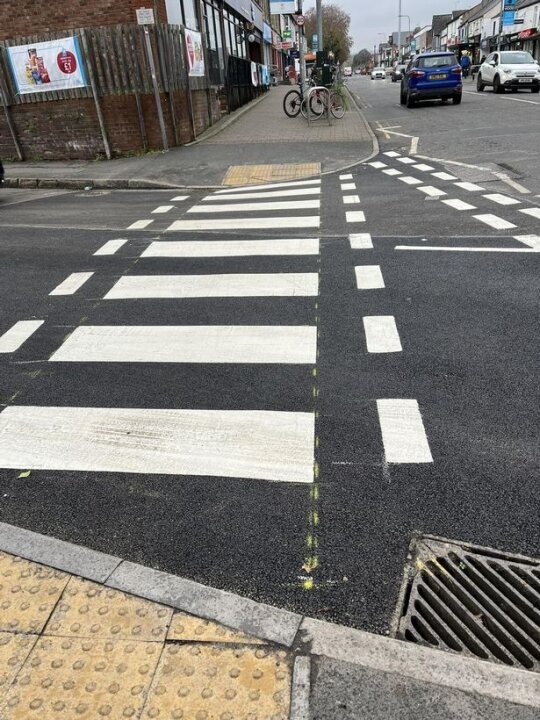

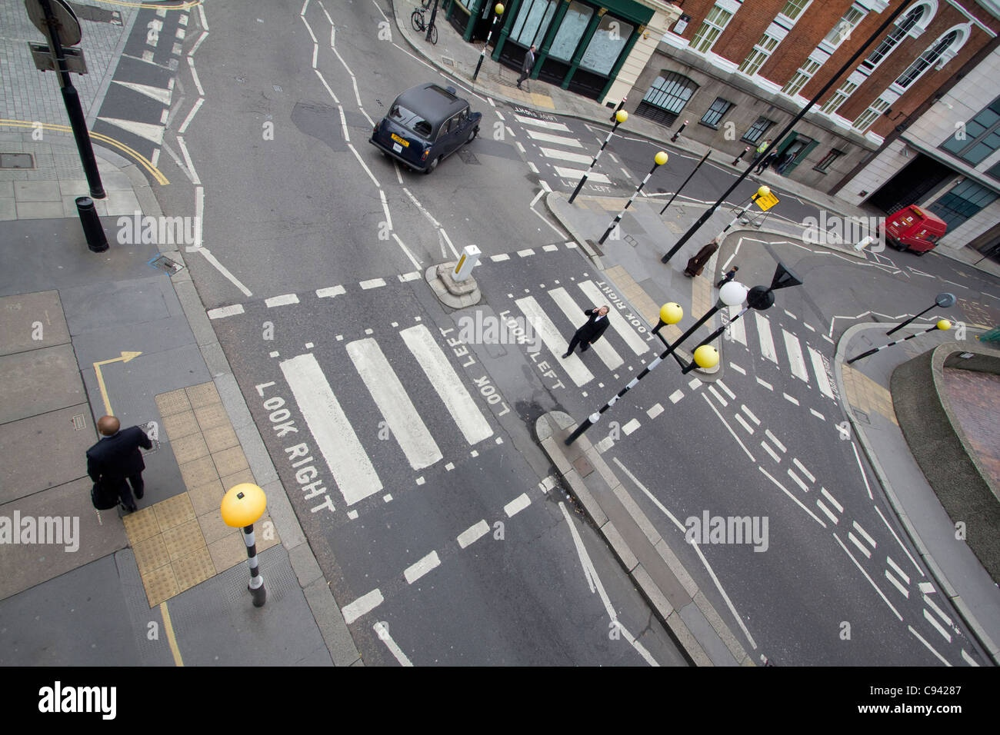

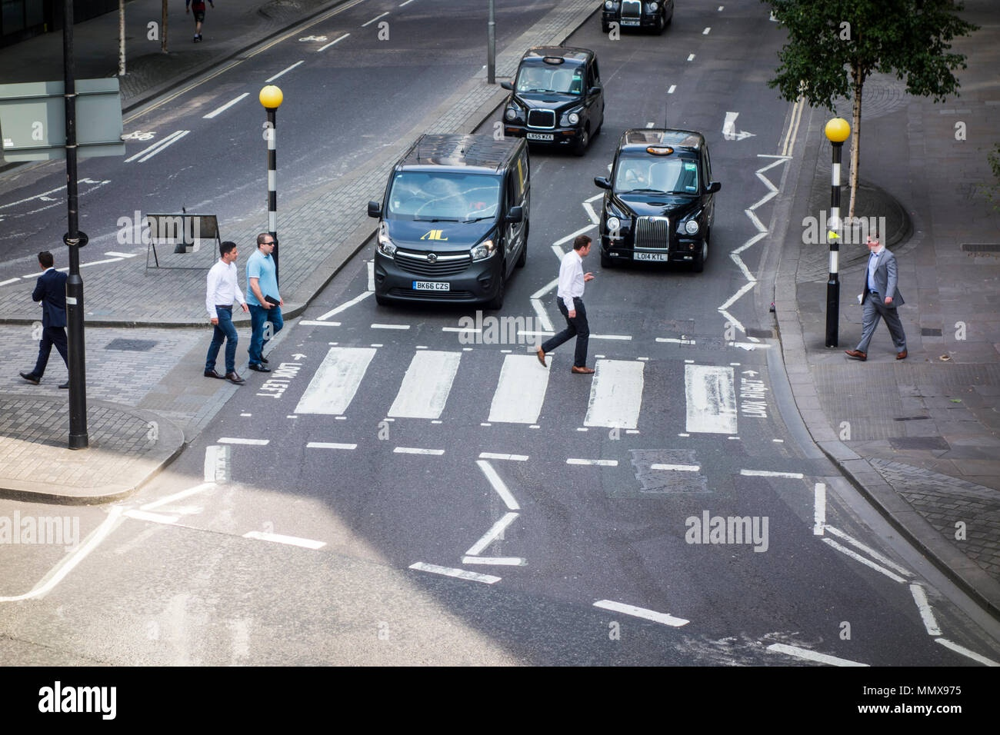

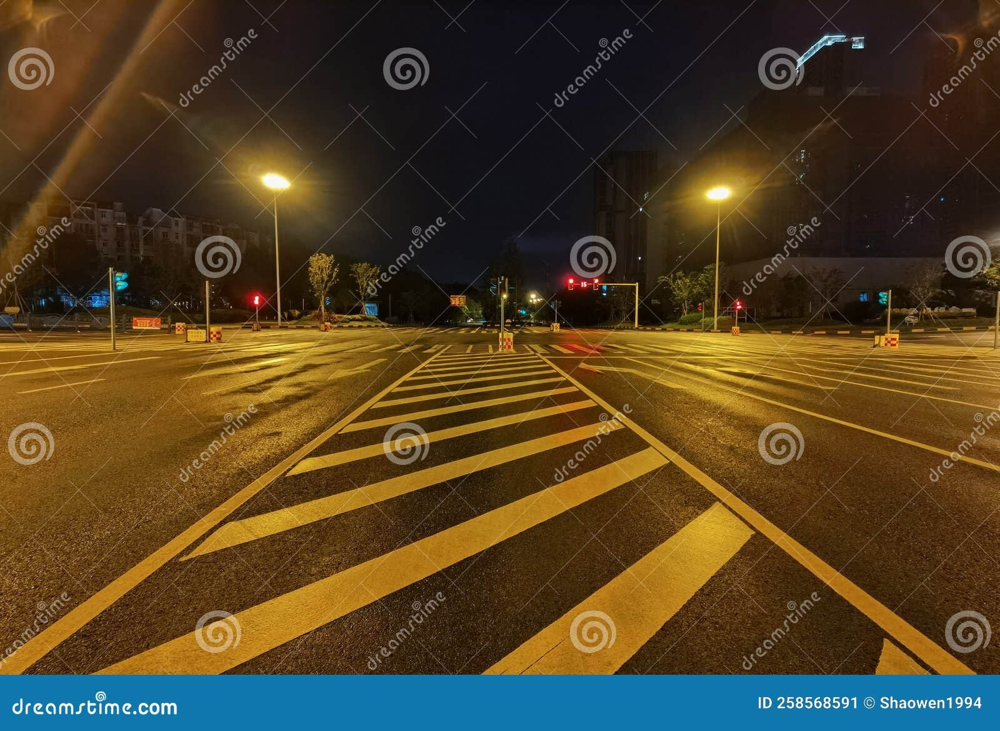

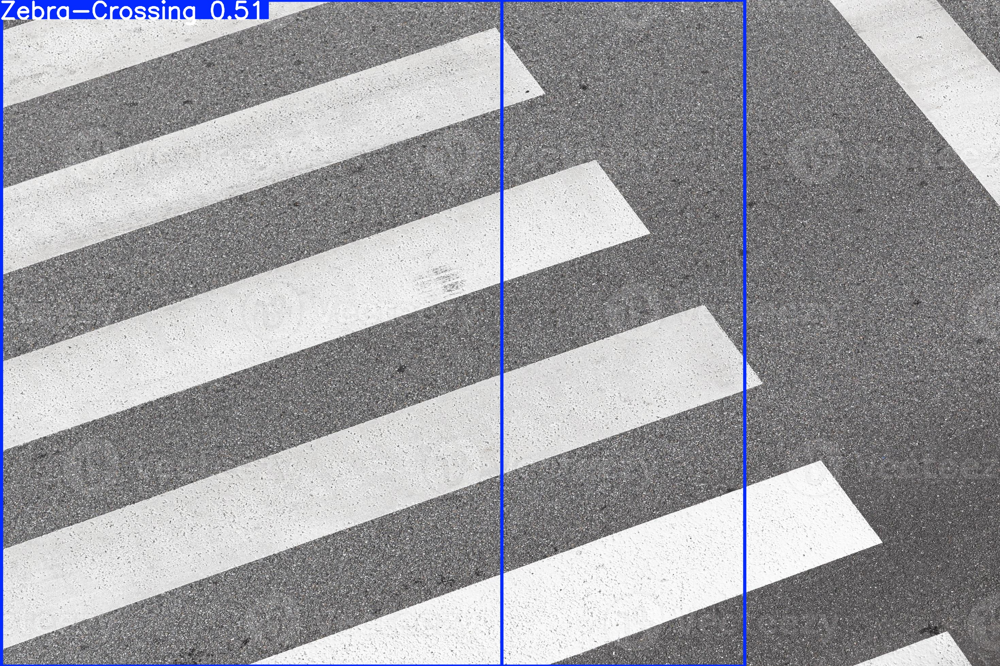

...

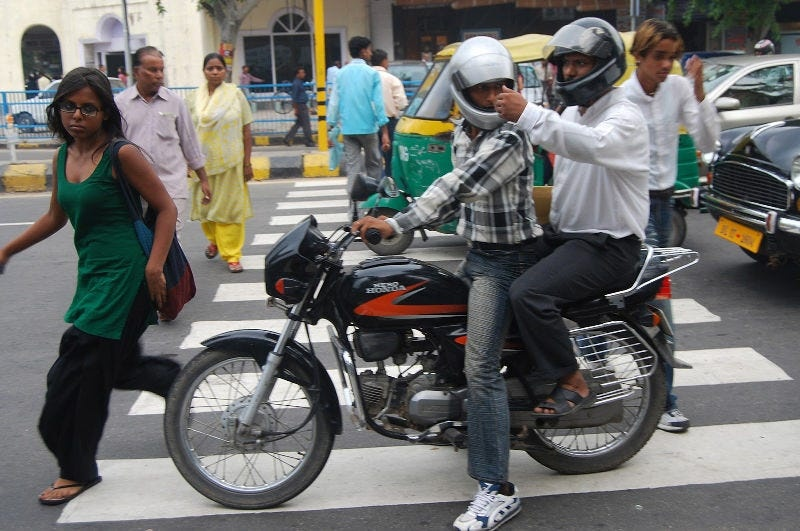

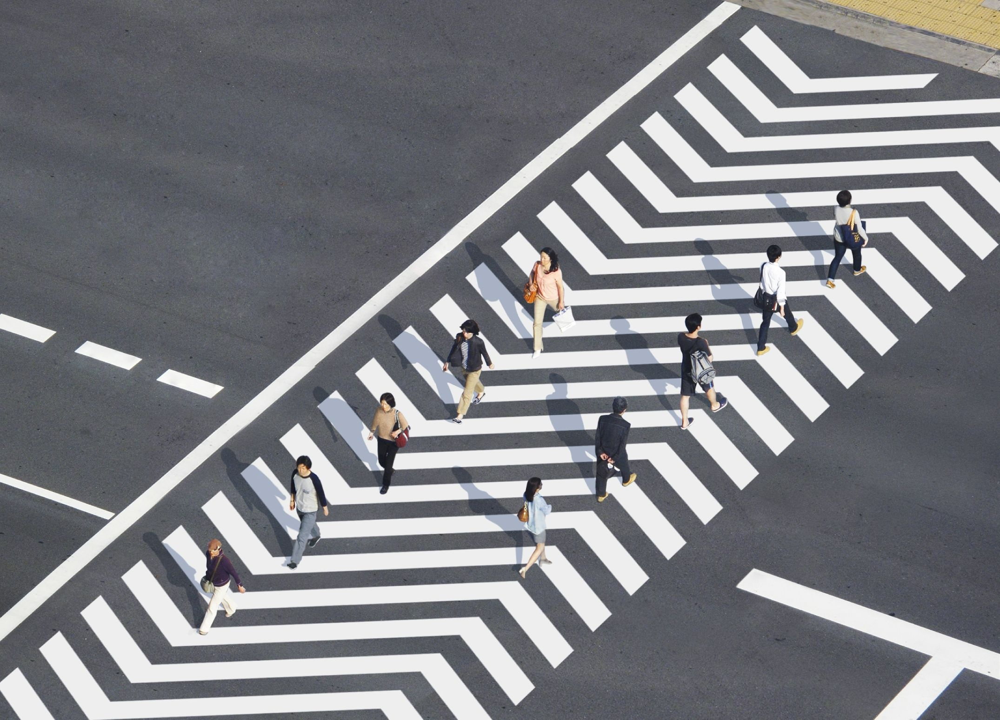

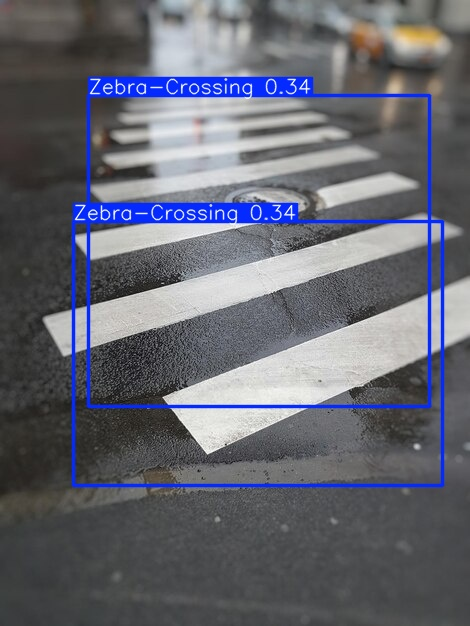

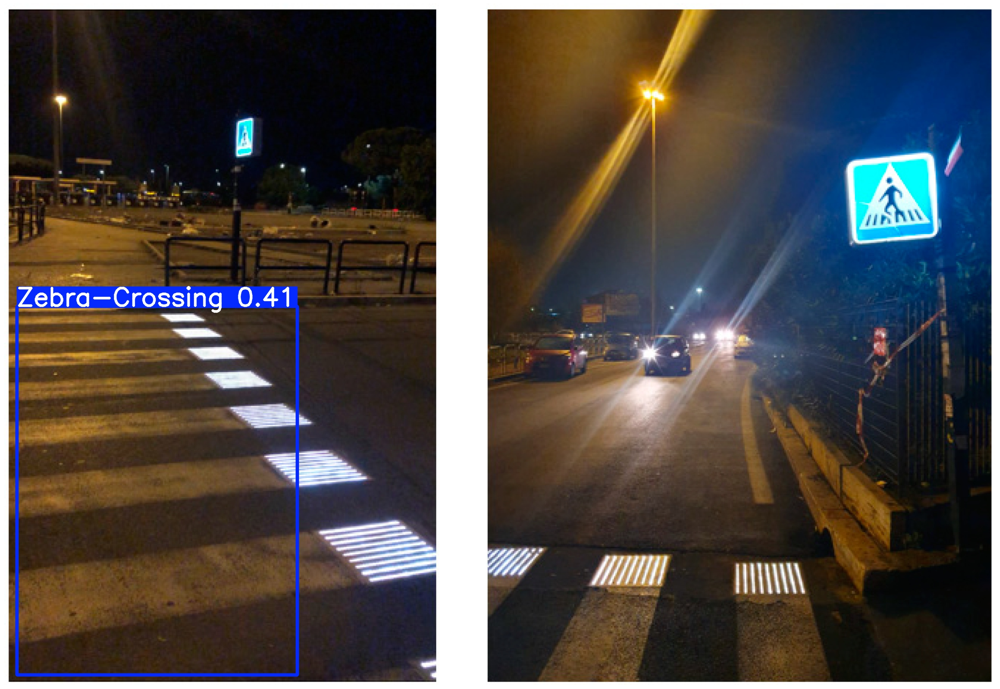

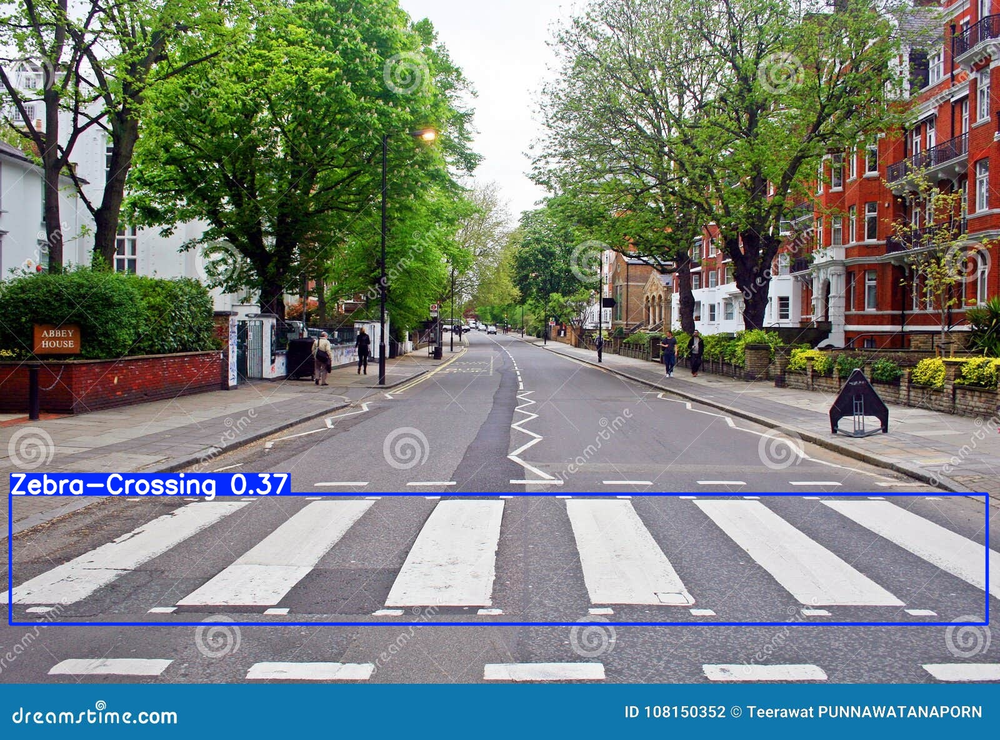

In [8]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:15]:
  display(Image(filename=image_path, height=400))
  print('\n')


In [ ]:
# Zip the 'data' folder into "data.zip"
%cd /content
!zip -r /content/data.zip /content/data

/content
  adding: content/data/ (stored 0%)
  adding: content/data/validation/ (stored 0%)
  adding: content/data/validation/images/ (stored 0%)
  adding: content/data/validation/images/00612402-Image_123.jpg (deflated 1%)
  adding: content/data/validation/images/58aefcf7-night_5.jpg (deflated 3%)
  adding: content/data/validation/images/02409ede-Image_138.jpg (deflated 0%)
  adding: content/data/validation/images/20717fb2-Image_173.jpg (deflated 0%)
  adding: content/data/validation/images/f3cec950-rainy_day_29.jpg (deflated 2%)
  adding: content/data/validation/images/3bfc4dfd-rainy_day_8.jpg (deflated 0%)
  adding: content/data/validation/images/3b18591a-rainy_day_7.jpg (deflated 5%)
  adding: content/data/validation/images/fb23f413-Image_170.jpg (deflated 0%)
  adding: content/data/validation/images/d121f710-rainy_day_15.jpg (deflated 2%)
  adding: content/data/validation/images/fdf0abce-Image_113.jpg (deflated 1%)
  adding: content/data/validation/images/a0a8a5a2-low_light_3.jpg 